In [33]:
import pandas as pd 

In [34]:
data = pd.read_csv(r"/home/ronodeep/thesisfinal-1/all_images_mapping_with_types.csv")

In [35]:
data.head()

,Case Number,Original Filename,Original Path,New Filename,Image Type
0,1,AAAW3.jpg,Case 001/AAAW3.jpg,AAAW3.jpg,After acetic acid
1,1,AAAW2.jpg,Case 001/AAAW2.jpg,AAAW2.jpg,After acetic acid with green filter
2,1,AAAW1.jpg,Case 001/AAAW1.jpg,AAAW1.jpg,After normal saline
3,1,AAAW4.jpg,Case 001/AAAW4.jpg,AAAW4.jpg,After Lugol’s iodine
4,2,AADE4.jpg,Case 002/AADE4.jpg,AADE4.jpg,After Lugol’s iodine


In [36]:
data = data.dropna(axis=1)

In [37]:
data.head()

,Case Number,Original Filename,Original Path,New Filename,Image Type
0,1,AAAW3.jpg,Case 001/AAAW3.jpg,AAAW3.jpg,After acetic acid
1,1,AAAW2.jpg,Case 001/AAAW2.jpg,AAAW2.jpg,After acetic acid with green filter
2,1,AAAW1.jpg,Case 001/AAAW1.jpg,AAAW1.jpg,After normal saline
3,1,AAAW4.jpg,Case 001/AAAW4.jpg,AAAW4.jpg,After Lugol’s iodine
4,2,AADE4.jpg,Case 002/AADE4.jpg,AADE4.jpg,After Lugol’s iodine


In [38]:
data = data.drop(columns=["Case Number"])

In [39]:
data.head()

,Original Filename,Original Path,New Filename,Image Type
0,AAAW3.jpg,Case 001/AAAW3.jpg,AAAW3.jpg,After acetic acid
1,AAAW2.jpg,Case 001/AAAW2.jpg,AAAW2.jpg,After acetic acid with green filter
2,AAAW1.jpg,Case 001/AAAW1.jpg,AAAW1.jpg,After normal saline
3,AAAW4.jpg,Case 001/AAAW4.jpg,AAAW4.jpg,After Lugol’s iodine
4,AADE4.jpg,Case 002/AADE4.jpg,AADE4.jpg,After Lugol’s iodine


In [40]:
data = data.drop(columns=["Original Filename"])

In [41]:
data = data.drop(columns=["Original Path"])

In [42]:
data.head()

,New Filename,Image Type
0,AAAW3.jpg,After acetic acid
1,AAAW2.jpg,After acetic acid with green filter
2,AAAW1.jpg,After normal saline
3,AAAW4.jpg,After Lugol’s iodine
4,AADE4.jpg,After Lugol’s iodine


In [43]:
# Load the dataset with image types
df = pd.read_csv("all_images_mapping_with_types.csv")

# Print the number of unique values for each column
for column in df.columns:
    unique_count = df[column].nunique()
    print(f"{column}: {unique_count} unique values")

# Get the unique image types and their counts
print("\nUnique Image Types:")
image_types = df['Image Type'].value_counts()
print(image_types)

# Total number of unique filenames
print(f"\nTotal unique image files: {df['New Filename'].nunique()}")

Case Number: 200 unique values
Original Filename: 913 unique values
Original Path: 913 unique values
New Filename: 913 unique values
Image Type: 24 unique values

Unique Image Types:
Image Type
After acetic acid                                                  293
After Lugol’s iodine                                               153
After normal saline                                                151
After normal saline with green filter                               91
After acetic acid with green filter                                 80
Speculum examination                                                72
After acetic acid with higher magnification                         23
Visualization of the SCJ                                            15
Unknown                                                              9
Examination with endocervical speculum                               7
After acetic acid with endocervical speculum                         3
After acetic acid        

In [44]:
unique_values = data['Image Type'].unique()
print(unique_values)

['After acetic acid' 'After acetic acid with green filter'
 'After normal saline' 'After Lugol’s iodine' 'Speculum examination'
 'After normal saline with green filter'
 'After acetic acid with higher magnification' 'Unknown'
 'After acetic acid with endocervical speculum'
 'Examination with endocervical speculum' 'Visualization of the SCJ'
 'After normal saline with higher magnification'
 'Before speculum examination' 'Examination of endocervical canal'
 'Examination of endocervix' 'After Lugol’s iodine '
 'After acetic acid and pushing the polyp inside' 'After acetic acid '
 'Vulva before acetic acid' 'Vulva after acetic acid'
 'After normal saline with green filter with higher magnification'
 'Speculum examination with higher magnification'
 'Examination of the vagina' 'Examination of the vulva']


In [45]:
import numpy as np
for i in unique_values:
    print(i, np.where(unique_values==i)[0][0])

After acetic acid 0
After acetic acid with green filter 1
After normal saline 2
After Lugol’s iodine 3
Speculum examination 4
After normal saline with green filter 5
After acetic acid with higher magnification 6
Unknown 7
After acetic acid with endocervical speculum 8
Examination with endocervical speculum 9
Visualization of the SCJ 10
After normal saline with higher magnification 11
Before speculum examination 12
Examination of endocervical canal 13
Examination of endocervix 14
After Lugol’s iodine  15
After acetic acid and pushing the polyp inside 16
After acetic acid  17
Vulva before acetic acid 18
Vulva after acetic acid 19
After normal saline with green filter with higher magnification 20
Speculum examination with higher magnification 21
Examination of the vagina 22
Examination of the vulva 23


In [46]:
%pip install scikit-image

Note: you may need to restart the kernel to use updated packages.


In [47]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.segmentation import slic
from skimage.color import rgb2lab
from skimage.measure import regionprops
from skimage.util import img_as_float
import networkx as nx
import torch
from torch_geometric.data import Data, Dataset, DataLoader
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, global_mean_pool

In [48]:
def extract_superpixels(image_path, n_segments=100):
    # Load image
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read image at {image_path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Generate superpixels
    segments = slic(img_as_float(img), n_segments=n_segments, compactness=10, sigma=1)
    
    # Extract features for each superpixel
    superpixel_features = []
    
    # Convert to LAB for better color features
    img_lab = rgb2lab(img)
    
    for segment_id in np.unique(segments):
        # Create mask for this superpixel
        mask = segments == segment_id
        
        # Extract color features (mean and std of RGB and LAB)
        rgb_mean = img[mask].mean(axis=0)
        rgb_std = img[mask].std(axis=0)
        lab_mean = img_lab[mask].mean(axis=0)
        lab_std = img_lab[mask].std(axis=0)
        
        # Extract size and shape features
        props = regionprops(mask.astype(int))[0]
        area = props.area
        perimeter = props.perimeter
        if perimeter > 0:
            circularity = 4 * np.pi * area / (perimeter ** 2)
        else:
            circularity = 0
        
        # Combine all features
        features = np.concatenate([
            rgb_mean, rgb_std, 
            lab_mean, lab_std,
            [area, perimeter, circularity]
        ])
        
        superpixel_features.append(features)
    
    return np.array(superpixel_features), segments

In [49]:
def are_adjacent(segments, id1, id2):
    """Check if two superpixels are adjacent"""
    # Create boundary pixels for both segments
    mask1 = segments == id1
    mask2 = segments == id2
    
    # Dilate masks to find overlapping boundaries
    kernel = np.ones((3, 3), np.uint8)
    dilated1 = cv2.dilate(mask1.astype(np.uint8), kernel, iterations=1)
    
    # If dilated mask of segment1 overlaps with segment2, they are adjacent
    return np.any(dilated1 & mask2)

def build_graph(image_path, n_segments=100):
    """Build a graph from superpixels in an image"""
    superpixel_features, segments = extract_superpixels(image_path, n_segments)
    
    # Create a graph where nodes are superpixels
    G = nx.Graph()
    
    # Add nodes with features
    for idx, features in enumerate(superpixel_features):
        G.add_node(idx, features=features)
    
    # Add edges based on adjacency
    # Check adjacency for each pair of segments
    for i in range(len(superpixel_features)):
        for j in range(i+1, len(superpixel_features)):
            if are_adjacent(segments, i, j):
                G.add_edge(i, j)
    
    # Convert to PyTorch Geometric data
    node_features = torch.tensor([G.nodes[i]['features'] for i in G.nodes], dtype=torch.float)
    
    # Create edge index tensor
    if len(G.edges) > 0:
        edge_index = torch.tensor(list(G.edges)).t().contiguous()
        # Add reverse edges for undirected graph
        edge_index = torch.cat([edge_index, edge_index.flip(0)], dim=1)
    else:
        # Handle case with no edges
        edge_index = torch.zeros((2, 0), dtype=torch.long)
    
    return Data(x=node_features, edge_index=edge_index), segments

In [50]:
def visualize_superpixels(image_path, segments):
    """Visualize superpixel segmentation"""
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Create a figure with subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
    
    # Display original image
    ax1.imshow(img)
    ax1.set_title('Original Image')
    ax1.axis('off')
    
    # Mark boundaries of segments on a copy of the image
    from skimage.segmentation import mark_boundaries
    marked_img = mark_boundaries(img, segments)
    ax2.imshow(marked_img)
    ax2.set_title(f'Superpixel Segmentation (n={len(np.unique(segments))})')
    ax2.axis('off')
    
    plt.tight_layout()
    plt.show()

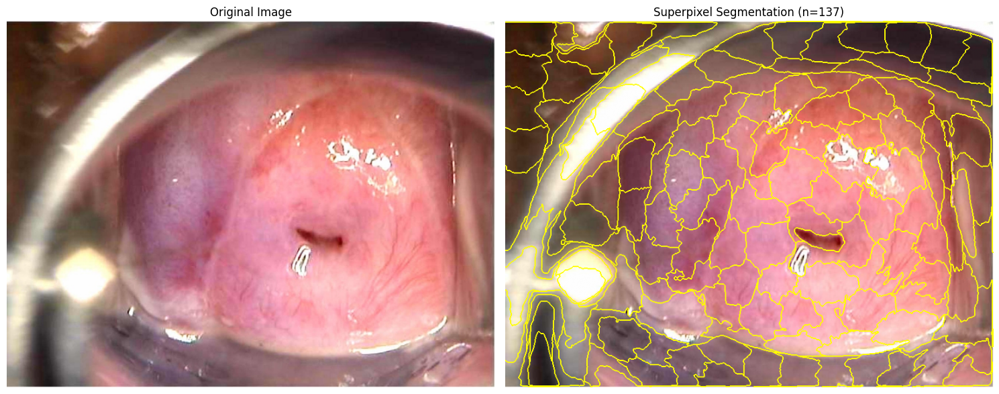

Graph has 137 nodes and 756 edges
Node feature dimensions: torch.Size([137, 15])


In [61]:
# Load your image data
df = pd.read_csv("all_images_mapping_with_types.csv")

# Test on a single image
test_row = df.iloc[900]  # First image for testing
image_path = os.path.join('all_colposcopy_images', test_row['New Filename'])

# Build graph from superpixels
graph, segments = build_graph(image_path, n_segments=150)

# Visualize superpixels
visualize_superpixels(image_path, segments)

# Print graph info
print(f"Graph has {graph.num_nodes} nodes and {graph.num_edges} edges")
print(f"Node feature dimensions: {graph.x.shape}")

In [52]:
class CervicalImageDataset(Dataset):
    def __init__(self, image_df, img_dir, n_segments=100, transform=None):
        self.image_df = image_df
        self.img_dir = img_dir
        self.n_segments = n_segments
        self.transform = transform
        
        # Create mapping for image types to numeric values
        self.type_mapping = {t: i for i, t in enumerate(image_df['Image Type'].unique())}
        
    def len(self):
        return len(self.image_df)
    
    def get(self, idx):
        row = self.image_df.iloc[idx]
        image_path = os.path.join(self.img_dir, row['New Filename'])
        
        # Build graph from image
        try:
            graph, _ = build_graph(image_path, n_segments=self.n_segments)
            
            # Add image type as graph-level feature
            type_idx = self.type_mapping[row['Image Type']]
            graph.y = torch.tensor([type_idx], dtype=torch.long)
            
            # Add case number for reference
            graph.case_num = row['Case Number']
            
            return graph
        except Exception as e:
            print(f"Error processing image {row['New Filename']}: {e}")
            # Return a dummy graph for failed processing
            return Data(x=torch.zeros((1, 19)), edge_index=torch.zeros((2, 0), dtype=torch.long), y=torch.tensor([0], dtype=torch.long))

In [53]:
class CervicalImageDataset(torch.utils.data.Dataset):  # Use PyTorch's standard Dataset
    def __init__(self, image_df, img_dir, n_segments=100, transform=None):
        self.image_df = image_df
        self.img_dir = img_dir
        self.n_segments = n_segments
        self.transform = transform
        
        # Create mapping for image types to numeric values
        self.type_mapping = {t: i for i, t in enumerate(image_df['Image Type'].unique())}
        
    def __len__(self):  # Standard PyTorch method name
        return len(self.image_df)
    
    def __getitem__(self, idx):  # Standard PyTorch method name
        row = self.image_df.iloc[idx]
        image_path = os.path.join(self.img_dir, row['New Filename'])
        
        # Build graph from image
        try:
            graph, _ = build_graph(image_path, n_segments=self.n_segments)
            
            # Add image type as graph-level feature
            type_idx = self.type_mapping[row['Image Type']]
            graph.y = torch.tensor([type_idx], dtype=torch.long)
            
            # Add case number for reference
            graph.case_num = row['Case Number']
            
            return graph
        except Exception as e:
            print(f"Error processing image {row['New Filename']}: {e}")
            # Return a dummy graph for failed processing
            return Data(x=torch.zeros((1, 19)), edge_index=torch.zeros((2, 0), dtype=torch.long), y=torch.tensor([0], dtype=torch.long))

In [54]:
class CervicalImageGNN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, num_classes):
        super().__init__()
        # Reduce model complexity
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.bn1 = torch.nn.BatchNorm1d(hidden_channels)
        self.conv2 = GCNConv(hidden_channels, hidden_channels)
        self.bn2 = torch.nn.BatchNorm1d(hidden_channels)
        self.linear = torch.nn.Linear(hidden_channels, num_classes)
    
    def forward(self, data):
        x, edge_index, batch = data.x, data.edge_index, data.batch
        
        if batch is None:
            batch = torch.zeros(x.size(0), dtype=torch.long, device=x.device)
        
        # Faster forward pass with batch normalization
        x = self.conv1(x, edge_index)
        x = self.bn1(x)
        x = F.relu(x)
        x = F.dropout(x, p=0.2, training=self.training)
        
        x = self.conv2(x, edge_index)
        x = self.bn2(x)
        x = F.relu(x)
        
        # Global pooling
        x = global_mean_pool(x, batch)
        
        # Classification layer
        x = self.linear(x)
        
        return F.log_softmax(x, dim=1)

In [55]:
# Create the full dataset
full_dataset = CervicalImageDataset(
    image_df=df,
    img_dir='all_colposcopy_images',
    n_segments=100
)

# Split into train/val/test sets (80/10/10)
train_size = int(0.8 * len(full_dataset))
val_size = int(0.1 * len(full_dataset))
test_size = len(full_dataset) - train_size - val_size

train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(
    full_dataset, [train_size, val_size, test_size]
)

# Create data loaders
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

# Initialize model
num_features = full_dataset[0].num_node_features
num_classes = len(full_dataset.type_mapping)

model = CervicalImageGNN(
    in_channels=num_features,
    hidden_channels=64,
    num_classes=num_classes
)

# Setup optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
criterion = torch.nn.NLLLoss()

print(f"Model initialized with {num_features} input features and {num_classes} output classes")

/home/ronodeep/thesisfinal-1/p3/lib/python3.11/site-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Model initialized with 15 input features and 24 output classes


In [56]:
# Check if CUDA (GPU) is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Initialize model and move to device
model = CervicalImageGNN(
    in_channels=num_features,
    hidden_channels=64,
    num_classes=num_classes
).to(device)

# Setup optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
criterion = torch.nn.NLLLoss()

print(f"Model initialized with {num_features} input features and {num_classes} output classes")

Using device: cuda
Model initialized with 15 input features and 24 output classes


In [57]:
from tqdm import tqdm
import time 
torch.autograd.set_detect_anomaly(True)
# Add this code BEFORE your training loop
print("Preprocessing and caching all graphs...")


preprocessed_graphs = []

for idx in tqdm(range(len(full_dataset))):
    graph = full_dataset[idx]
    preprocessed_graphs.append(graph)

# Now create a new dataset that loads the cached graphs
class CachedGraphDataset(torch.utils.data.Dataset):
    def __init__(self, graphs):
        self.graphs = graphs
    
    def __len__(self):
        return len(self.graphs)
    
    def __getitem__(self, idx):
        return self.graphs[idx]

# Use the cached dataset
cached_dataset = CachedGraphDataset(preprocessed_graphs)
train_size = int(0.8 * len(cached_dataset))
val_size = int(0.1 * len(cached_dataset))
test_size = len(cached_dataset) - train_size - val_size

train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(
    cached_dataset, [train_size, val_size, test_size]
)

# Create data loaders with more workers for faster loading
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, num_workers=4)

def train(model, loader, optimizer, criterion, device):
    with torch.autograd.profiler.profile(use_cuda=True) as prof:
        for epoch in range(2):
            train_loss = train(model, train_loader, optimizer, criterion, device)
    print(prof.key_averages().table(sort_by="cuda_time_total", row_limit=10))
    
    model.train()
    total_loss = 0
    
    progress_bar = tqdm(loader, desc="Training")
    for data in progress_bar:
        # Move data to device
        data = data.to(device)
        optimizer.zero_grad()
        out = model(data)
        loss = criterion(out, data.y)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * data.num_graphs
        
        
        progress_bar.set_postfix({"loss": loss.item()})
    
    return total_loss / len(loader.dataset)

def evaluate(model, loader, device):
    model.eval()
    correct = 0
    
    with torch.no_grad():
        for data in loader:
            # Move data to device
            data = data.to(device)
            out = model(data)
            pred = out.argmax(dim=1)
            correct += int((pred == data.y).sum())
    
    return correct / len(loader.dataset)

# Train the model
num_epochs = 50
best_val_acc = 0
best_model = None
start_time = time.time()
for epoch in range(num_epochs):
    epoch_start_time = time.time()
    train_loss = train(model, train_loader, optimizer, criterion, device)
    train_acc = evaluate(model, train_loader, device)
    val_acc = evaluate(model, val_loader, device)
    
    epoch_end_time = time.time()
    epoch_duration = epoch_end_time - epoch_start_time
    
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_model = model.state_dict().copy()
    
    print(f'Epoch: {epoch:03d}, Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}, Time: {epoch_duration:.2f}s')

# Load best model and evaluate on test set
model.load_state_dict(best_model)
test_acc = evaluate(model, test_loader, device)
print(f'Test Accuracy: {test_acc:.4f}')

Preprocessing and caching all graphs...


100%|██████████| 913/913 [35:34<00:00,  2.34s/it]
/tmp/ipykernel_18427/9783387.py:41: FutureWarning: The attribute `use_cuda` will be deprecated soon, please use ``use_device = 'cuda'`` instead.
  with torch.autograd.profiler.profile(use_cuda=True) as prof:


RuntimeError: Can't disable Kineto profiler when it's not running